# CSDA Evaluation Sites overview

| Author | Affiliation | Date |
| ---------------- | ---------------- | ---------------- |
| Paul Montesano, PhD | Innovation Lab ; NASA Goddard Space Flight Center | Aug. 2025 |

In [1]:
library(ggplot2)
library(sf)
library(tidyverse)
library(ggrepel)
library(RColorBrewer)
library(leaflet)

Warning message:
“package ‘ggplot2’ was built under R version 4.4.3”
Linking to GEOS 3.12.2, GDAL 3.9.1, PROJ 9.4.1; sf_use_s2() is TRUE

Warning message:
“package ‘tidyverse’ was built under R version 4.4.3”
Warning message:
“package ‘tibble’ was built under R version 4.4.3”
Warning message:
“package ‘tidyr’ was built under R version 4.4.3”
Warning message:
“package ‘readr’ was built under R version 4.4.3”
Warning message:
“package ‘purrr’ was built under R version 4.4.3”
Warning message:
“package ‘dplyr’ was built under R version 4.4.3”
Warning message:
“package ‘stringr’ was built under R version 4.4.3”
Warning message:
“package ‘forcats’ was built under R version 4.4.3”
Warning message:
“package ‘lubridate’ was built under R version 4.4.3”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ readr     2.2.0
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ lubridate 1.9.5     ✔ tibble    3.3.1
✔ purrr     1.2.2     ✔ tidyr     1.3.2
── Co

### Use function to make map

In [36]:
source('../lib/eval_sites_overview.R')

rnaturalearth unavailable, reading continents from local file...

Warning message in st_cast.sf(., "LINESTRING", do_split = TRUE):
“repeating attributes for all sub-geometries for which they may not be constant”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”


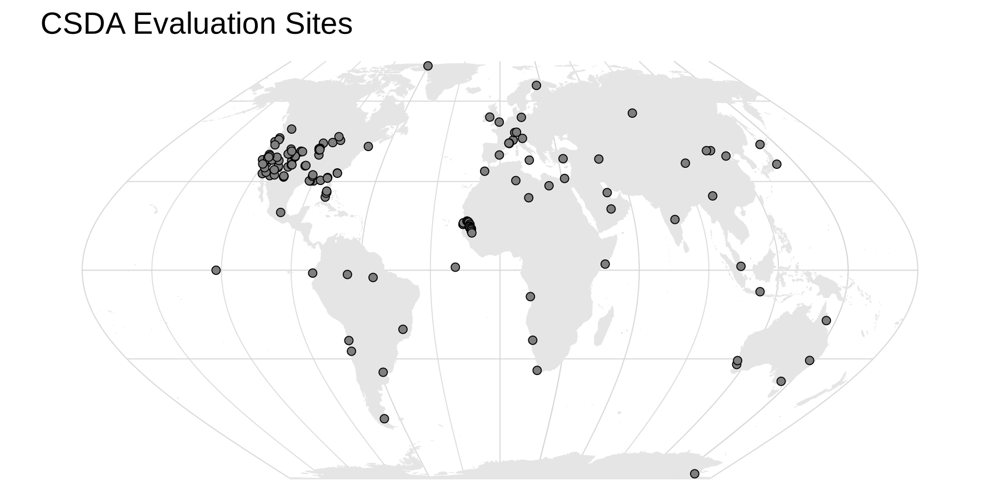

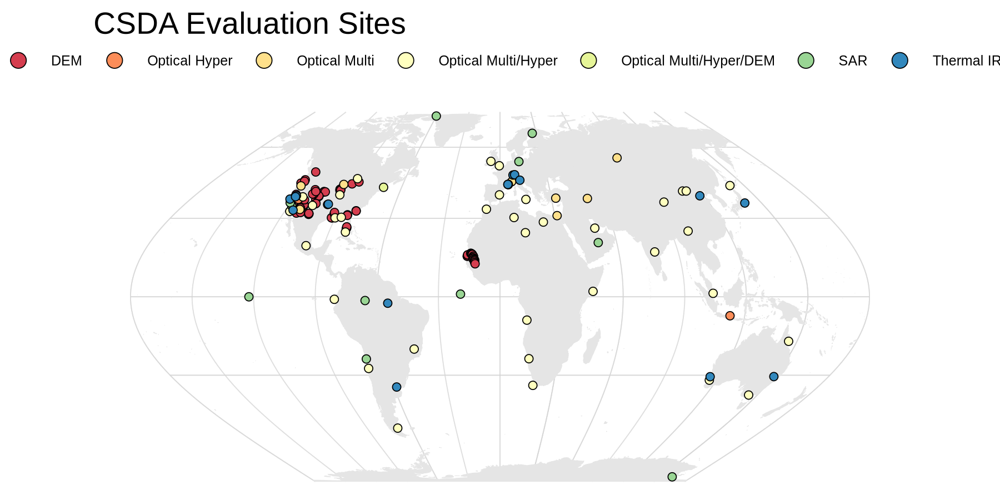

Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”


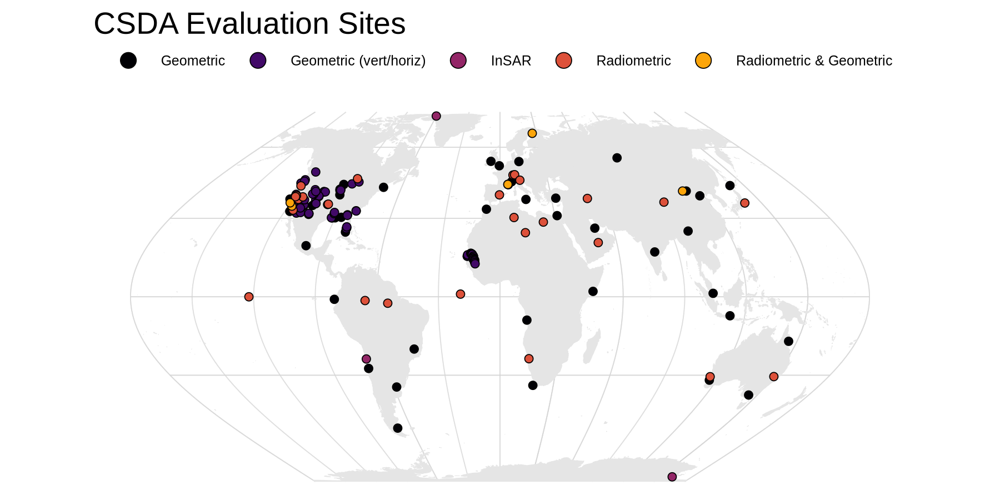

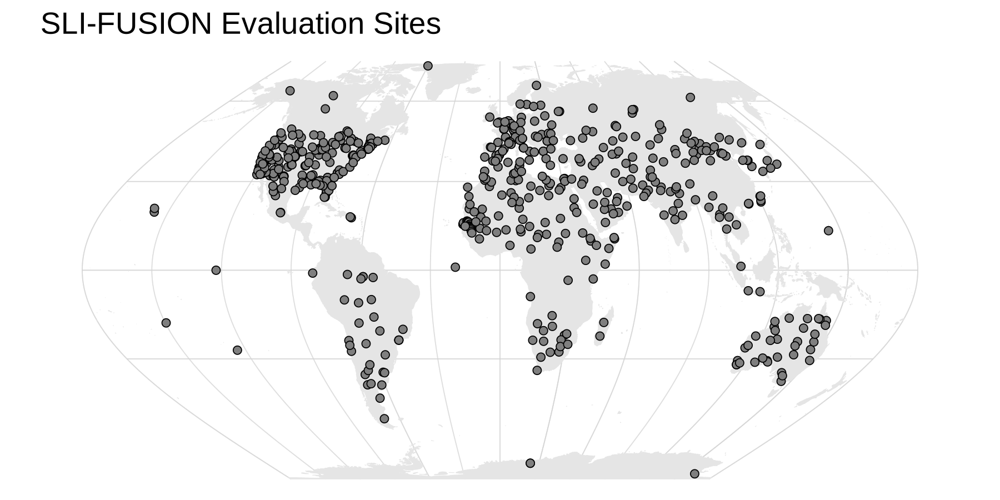

In [37]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)

# One-call: everything built with defaults
maps <- make_eval_site_overview()

# Display individual maps
maps$map_csda
maps$map_csda_sme_domain
maps$map_csda_eval_cat
maps$map_fusion

In [38]:
# library(rnaturalearth)
# library(rnaturalearthdata)

In [39]:
# SHEET_NAME <- 'Evaluation Sites'
# SPREADSHEET_ID = '13MrpqFtAOqQY9WdW9lHNsqjCbG-e3VQkEDbHOGIKa6k'

# # URL encode using base R
# ENCODED_SHEET_NAME <- URLencode(SHEET_NAME, reserved = TRUE)

# # Construct URL
# url <- paste0("https://docs.google.com/spreadsheets/d/", SPREADSHEET_ID, 
#               "/gviz/tq?tqx=out:csv&sheet=", ENCODED_SHEET_NAME)

# # Read and process
# tryCatch({
#     sites_df <- read.csv(url, stringsAsFactors = FALSE) %>% 
#         select(-starts_with("X"))
#     sites_df$Site.Name <- trimws(sites_df$Site.Name, which = "right")
    
# }, error = function(e) {
#     message("An error occurred: ", e$message)
# })

# colnames(sites_df)

In [40]:
#sites_df = read_csv('/projects/my-private-bucket/databank/csda/CSDA SME Evaluation Sites(SME sites).csv')

In [41]:
# # Convert to sf object
# sites_sf <- st_as_sf(sites_df %>% 
#                      filter(
#                          !is.na(`Longitude`),
#                          !is.na(`Evaluation.Category`),
#                      ), 
#                      #coords = c('Longitude (deg)', 'Latitude (deg)'), crs = 4326)
#                      coords = c('Longitude', 'Latitude'), crs = 4326)

# # Set CRS using WKT2 string to bypass PROJ database
# wgs84_wkt <- 'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433]]'
# sites_sf <- st_set_crs(sites_sf, 4326)

# # # Add continent info from world data
# # sites_with_continent <- st_join(sites_sf, world %>% select(continent))
# # sites_proj <- st_transform(sites_with_continent, crs = proj)

In [42]:
wgs84_wkt <- 'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433]]'

In [43]:
sites_url <- 'https://raw.githubusercontent.com/pahbs/csda_summaries/master/sites/eval_sites_aoi.geojson'
sites_eval <- st_read(sites_url)

Reading layer `eval_sites_aoi' from data source 
  `https://raw.githubusercontent.com/pahbs/csda_summaries/master/sites/eval_sites_aoi.geojson' 
  using driver `GeoJSON'
Simple feature collection with 597 features and 26 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -157.2105 ymin: -79.82374 xmax: 161.4719 ymax: 80.57685
Geodetic CRS:  WGS 84


In [9]:
# #sites_csda <- st_read("../sites/csda_sites_aoi.geojson")
# sites_eval <- st_read("../sites/eval_sites_aoi.geojson") # this has the CSDA sites

In [10]:
# Define the *full* set of categories (not just what's in the current data)
color_categories <- sort(unique(sites_eval$Remote.Sensing.Domain))

# Build named vector: each category → a specific Spectral color
my_colors <- setNames(
  brewer.pal(length(color_categories), "Spectral"),
  color_categories
)

# Pass the named vector to colorFactor with an explicit levels argument
color_pal <- colorFactor(
  palette = my_colors,
  domain  = color_categories,
  levels  = color_categories,    # ← critical: locks the mapping
  ordered = TRUE
)

In [11]:
continents <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')
head(continents)

Reading layer `continents' from data source 
  `/panfs/ccds02/nobackup/people/pmontesa/userfs02/arc/continents.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: -90 xmax: 180 ymax: 83.6236
Geodetic CRS:  WGS 84


Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,CONTINENT,geometry
,<chr>,<MULTIPOLYGON [°]>
1,Asia,MULTIPOLYGON (((93.27554 80...
2,North America,MULTIPOLYGON (((-25.28167 7...
3,Europe,MULTIPOLYGON (((58.06138 81...
4,Africa,MULTIPOLYGON (((0.694651 5....
5,South America,MULTIPOLYGON (((-81.71306 1...
6,Oceania,MULTIPOLYGON (((-177.3933 2...


In [12]:
world <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')
sites_sf_continents <- st_join(sites_eval, world, left = TRUE)

Reading layer `continents' from data source 
  `/panfs/ccds02/nobackup/people/pmontesa/userfs02/arc/continents.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: -90 xmax: 180 ymax: 83.6236
Geodetic CRS:  WGS 84


In [13]:
# Try to get ne_countries, fallback to local file if not available
tryCatch({
  world <- ne_countries(scale = "medium", returnclass = "sf")
  sites_sf_continents <- st_join(sites_eval, world, left = TRUE)
}, error = function(e) {
  message("ne_countries not available, reading from local file...")

})

#world <<- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/natural_earth/10m_physical/ne_10m_land.shp')
world <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')
sites_sf_continents <- st_join(sites_eval, world, left = TRUE)

# Store the original CRS
original_crs <- st_crs(world)
if (is.na(original_crs)) original_crs <- 4326

# Define orthographic projection (centered on 0°, 0°)
ortho_proj <- "+proj=ortho +lon_0=0 +lat_0=30 +ellps=WGS84 +datum=WGS84 +units=m +no_defs"
eckert6_proj <- "+proj=eck6 +lon_0=0 +x_0=0 +y_0=0 +ellps=WGS84 +datum=WGS84 +units=m +no_defs"

proj = eckert6_proj

world_proj <- world %>%
  st_set_crs(original_crs) %>%
  st_cast('MULTILINESTRING') %>%
  st_set_crs(original_crs) %>%
  st_cast('LINESTRING', do_split = TRUE) %>%
  st_set_crs(original_crs) %>%
  st_transform(crs = proj) %>%
  st_cast('POLYGON')

ne_countries not available, reading from local file...



Reading layer `continents' from data source 
  `/panfs/ccds02/nobackup/people/pmontesa/userfs02/arc/continents.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: -90 xmax: 180 ymax: 83.6236
Geodetic CRS:  WGS 84


Warning message in st_cast.sf(., "LINESTRING", do_split = TRUE):
“repeating attributes for all sub-geometries for which they may not be constant”


In [14]:
# world <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')

In [15]:
sites_sf_continents <- st_join(sites_eval, world, left = TRUE)

In [16]:
# Transform data to projection
sites_proj <- st_transform(sites_sf_continents, crs = proj)

In [20]:
# Create a circle to represent the globe edge
earth_radius <- 6371000

# Create center point in geographic coordinates, then transform
center_point <- st_sfc(st_point(c(0, 0)), crs = wgs84_wkt) %>%
  st_transform(crs = proj)

globe_edge <- st_buffer(center_point, earth_radius)
globe_edge_sf <- st_sf(geometry = globe_edge)

In [21]:
# Create graticule (grid lines)
graticule <- st_graticule(lat = seq(-90, 90, 30), lon = seq(-180, 180, 30))
graticule_proj <- st_transform(graticule, crs = proj)

graticule_with_continent <- st_join(graticule, world, left = FALSE)
graticule_proj <- st_transform(graticule_with_continent, crs = proj)

# Create the plot
base_map = ggplot() +
  # # First, draw the globe background (white circle)
  # geom_sf(data = globe_edge_sf, fill = "white", color = "black", size = 0.5) +
  # Optional: Add graticule for reference
  geom_sf(data = graticule_proj, color = "lightgray", size = 0.2, alpha = 0.5) +
  # Then add the continents
  geom_sf(data = world_proj, fill = "gray90", color = "gray90", size = 0.1) +
  theme_void() +
  theme(
    panel.background = element_rect(fill = "white", color = NA),
    plot.background = element_rect(fill = "white", color = NA),
    legend.text = element_text(size=6),
    legend.title = element_text(size=7),
    legend.position = "top",
    legend.direction = "vertical",  # Changed to vertical
    legend.box = "vertical"          # Added this
    #legend.spacing.y = unit(0.01, "cm") 
  ) +
  #labs(title = "Site Locations - Orthographic Projection") +
  coord_sf(crs = proj) 


In [22]:
colnames(sites_proj)
length(levels(factor(sites_proj$Source)))

[1] "site_id"               "Site.Name.abbrev"      "Site.Name"            
 [4] "Location.Name"         "Country"               "Program.Use"          
 [7] "Longitude"             "Latitude"              "Remote.Sensing.Domain"
[10] "Priority.Level"        "Evaluation.Category"   "Source"               
[13] "Surface.Domain"        "Assessment.type.s."    "Resolution.Category"  
[16] "aoi_shape"             "aoi_size_km"           "max_view_angle"       
[19] "min_num_acqs"          "ideal_num_acqs"        "max_cloud_pct_aoi"    
[22] "max_cloud_pct_scene"   "contact"               "reference"            
[25] "notes"                 "area_km2"              "CONTINENT"            
[28] "geometry"

[1] 16

In [23]:
# Get base Set1 colors (9 colors)
set1_base <- brewer.pal(9, "Set1")

# Extend by creating lighter/darker variations or repeating with alpha
extended_set1 <- colorRampPalette(set1_base)(length(levels(factor(sites_proj$Source))))

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


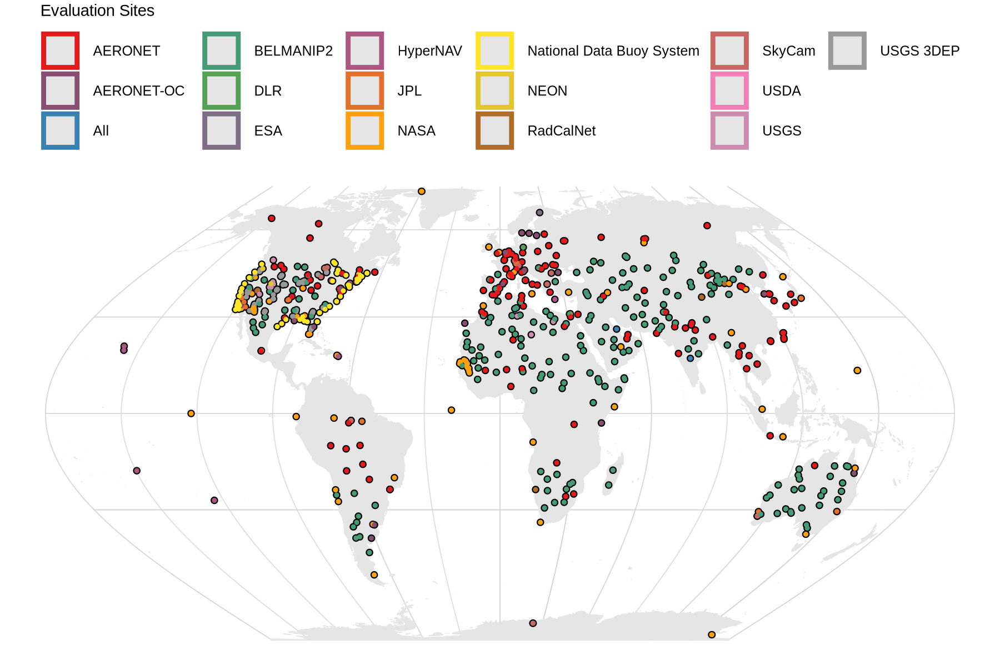

In [24]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    geom_sf(data = sites_proj , color='black', size = 1.5, shape=1) +
    geom_sf(data = sites_proj , aes(color=`Source`), size = 1, shape=1) +
    # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
    #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    #scale_color_brewer(palette = 'Set1', 
    scale_color_manual(values = extended_set1,
                       name=paste0('Evaluation Sites '),
                       guide = guide_legend(
                            ncol=6,
                            override.aes = list(
                                                size = 1.5,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) 

In [25]:
unique(sites_proj$Remote.Sensing.Domain)

[1] "Optical Multi/Hyper"     "SAR"                    
[3] "Optical Multi/Hyper/DEM" "Optical Multi"          
[5] "Optical Hyper"           "Thermal IR"             
[7] "DEM"

In [26]:
# Create color palette
color_categories <- unique(sites_proj$Remote.Sensing.Domain)
my_colors <- brewer.pal(length(color_categories), "Spectral")
names(my_colors) <- color_categories   # named vector → category-to-color mapping

In [27]:
# Define the *full* set of categories (not just what's in the current data)
color_categories <- sort(unique(sites_proj$Remote.Sensing.Domain))

# Build named vector: each category → a specific Spectral color
my_colors <- setNames(
  brewer.pal(length(color_categories), "Spectral"),
  color_categories
)

# Pass the named vector to colorFactor with an explicit levels argument
color_pal <- colorFactor(
  palette = my_colors,
  domain  = color_categories,
  levels  = color_categories,    # ← critical: locks the mapping
  ordered = TRUE
)

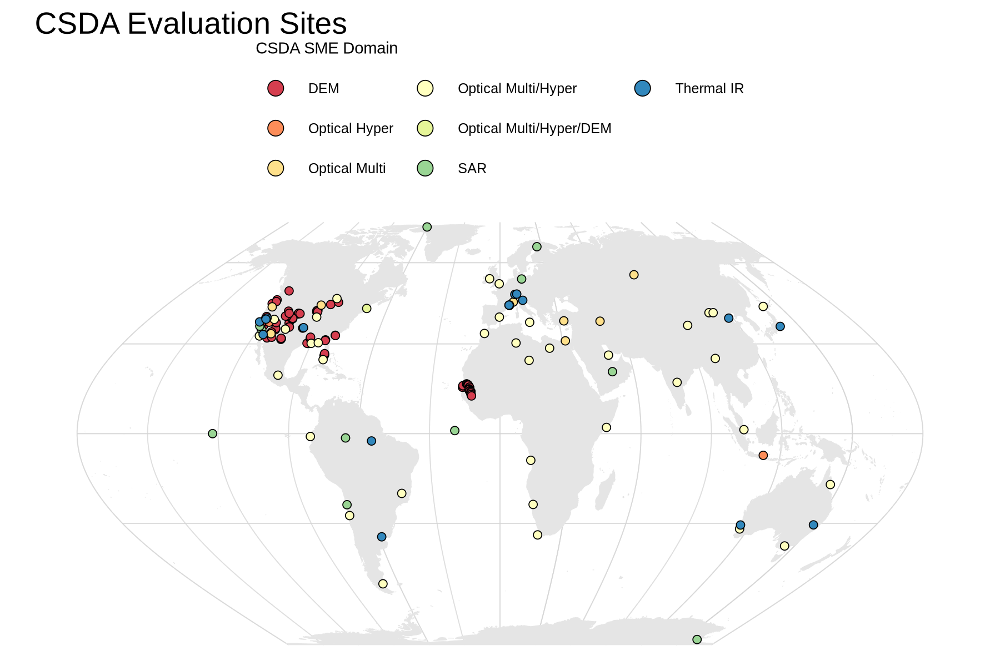

In [28]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    geom_point(data = sites_proj %>% filter(`Program.Use` == 'CSDA'),
           aes(geometry = geometry, fill = `Remote.Sensing.Domain`),
           stat = "sf_coordinates",
           shape = 21, size = 1.5, color = 'black', stroke = 0.3) +

    scale_fill_manual(values = my_colors, drop = FALSE,  # drop = FALSE keeps unused categories in legend
    #scale_color_manual(values = color_pal,
                       name = "CSDA SME Domain ",
                       guide = guide_legend(
                            ncol=3,
                            override.aes = list(
                                                size = 3,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) +
    labs(title="CSDA Evaluation Sites")

In [33]:
# Dynamically ramp the 12-color Paired palette up to 16 colors
custom_ramp <- colorRampPalette(brewer.pal(12, "Paired"))

my_colors <- setNames(
  custom_ramp(length(color_categories)),
  color_categories
)

Warning message in brewer.pal(length(color_categories), "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”


ERROR: Error in names(object) <- nm: 'names' attribute [16] must be the same length as the vector [12]


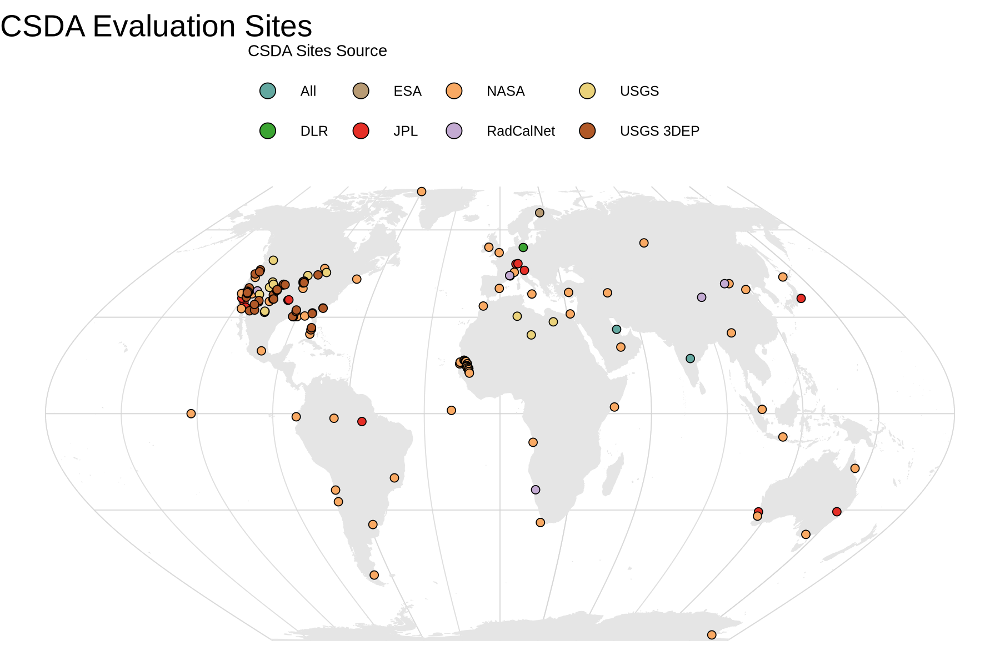

In [35]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

# Define the *full* set of categories (not just what's in the current data)
color_categories <- sort(unique(sites_proj$Source))

# Dynamically ramp the 12-color Paired palette up to 16 colors
custom_ramp <- colorRampPalette(brewer.pal(12, "Paired"))

my_colors <- setNames(
  custom_ramp(length(color_categories)),
  color_categories
)

# Pass the named vector to colorFactor with an explicit levels argument
color_pal <- colorFactor(
  palette = my_colors,
  domain  = color_categories,
  levels  = color_categories,    # ← critical: locks the mapping
  ordered = TRUE
)

base_map +   # Finally add the site points
    geom_point(data = sites_proj %>% filter(`Program.Use` == 'CSDA'),
           aes(geometry = geometry, fill = `Source`),
           stat = "sf_coordinates",
           shape = 21, size = 1.5, color = 'black', stroke = 0.3) +

    scale_fill_manual(values = my_colors, drop = FALSE,  # drop = FALSE keeps unused categories in legend
    #scale_color_manual(values = color_pal,
                       name = "CSDA Sites Source ",
                       guide = guide_legend(
                            ncol=5,
                            override.aes = list(
                                                size = 3,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) +
    labs(title="CSDA Evaluation Sites")

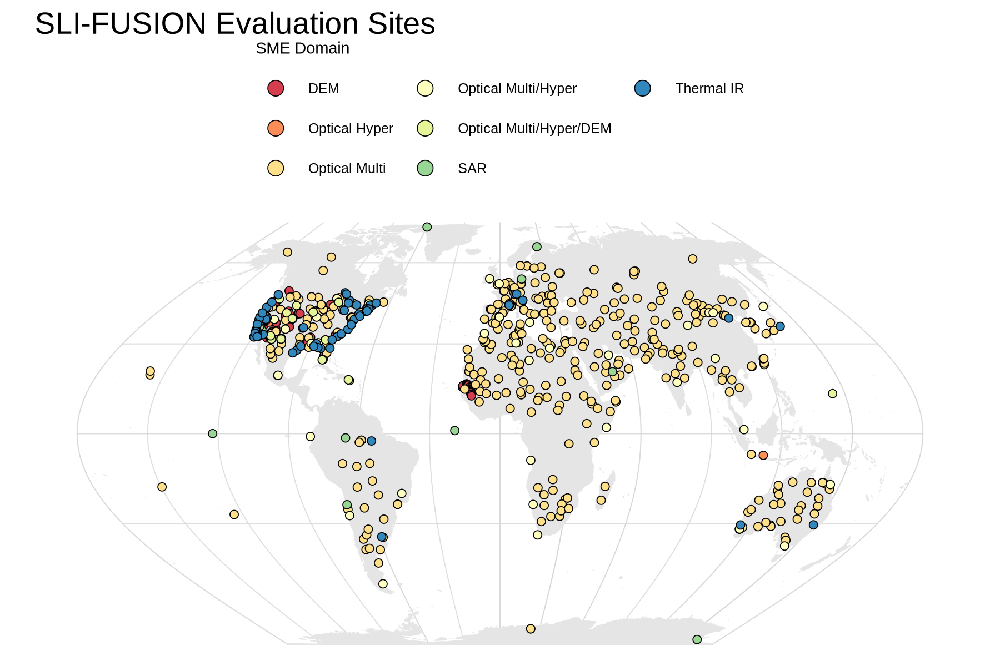

In [29]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    #geom_sf(data = sites_proj , color='black', size = 0.25, shape=19) +
    geom_point(data = sites_proj,
           aes(geometry = geometry, fill = `Remote.Sensing.Domain`),
           stat = "sf_coordinates",
           shape = 21, size = 1.5, color = 'black', stroke = 0.3) +
    scale_fill_manual(values = my_colors, drop = FALSE,  # drop = FALSE keeps unused categories in legend
    #scale_color_manual(values = color_pal,
                       name = "SME Domain ",
                       guide = guide_legend(
                            ncol=3,
                            override.aes = list(
                                                size = 3,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) +
        labs(title="SLI-FUSION Evaluation Sites") 

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


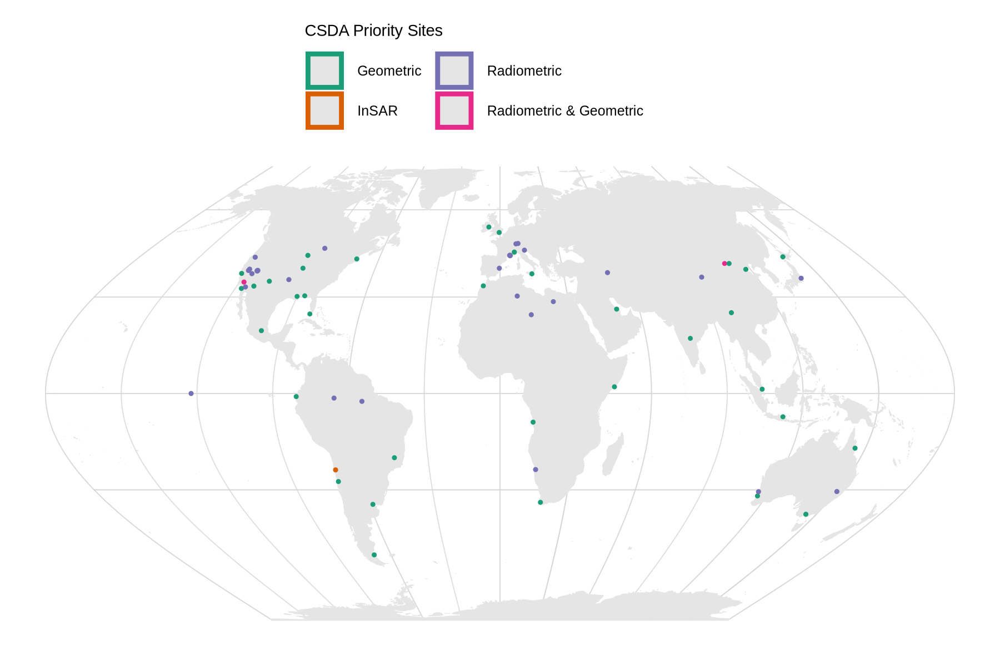

In [30]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    #geom_sf(data = sites_proj , color='black', size = 0.25, shape=19) +
    geom_sf(data = sites_proj %>% filter(`Priority.Level` == 'high'), aes(color=`Evaluation.Category`), size = 1, shape=1) +
    # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
    #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    scale_color_brewer(palette = 'Dark2', name=paste0('CSDA Priority Sites '),
                       guide = guide_legend(
                            ncol=3,
                            override.aes = list(
                                                size = 2,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) 

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


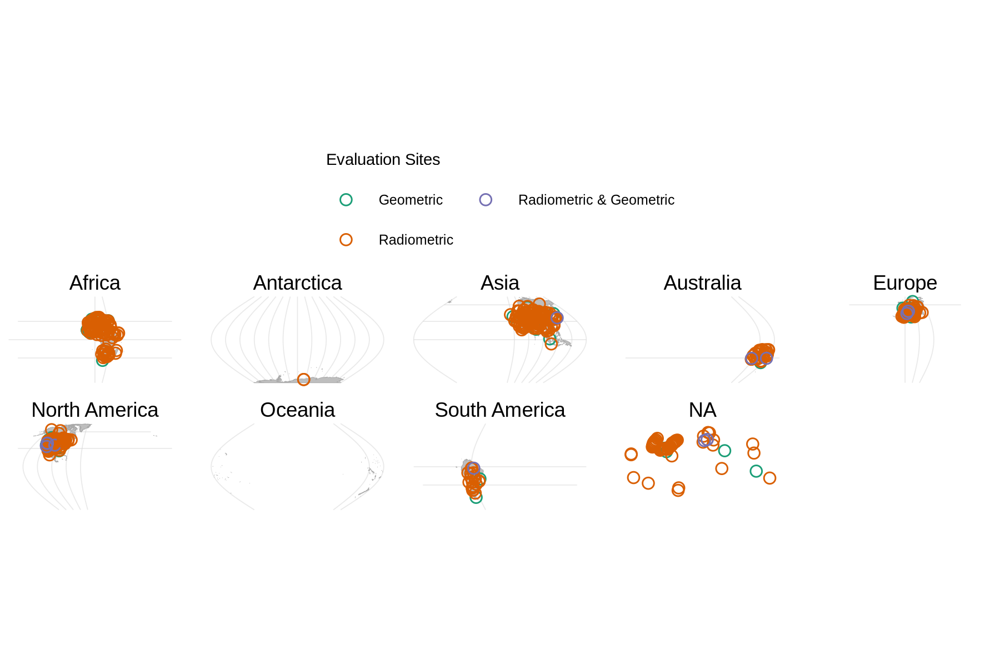

In [21]:
base_map +   # Finally add the site points
  geom_sf(data = sites_proj, aes(color=`Evaluation.Category`), size = 2, shape=1) +
  # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
  #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    scale_color_brewer(palette = 'Dark2', name=paste0('Evaluation Sites '),
                       guide = guide_legend(
                           ncol=2,
          override.aes = list(
            size = 2,          # Point size
            label = ""         # Remove text from legend
          )
        )
                      ) +
coord_sf(crs = proj) +
    facet_wrap(~CONTINENT, ncol=5)

In [22]:
site_strings <- c('Albuquerque', 'Singapore', 'Rio Gallegos', 'Libya-4','Casablanca','Catania', 'Baotou')
pattern <- paste(site_strings, collapse = "|")

sites_proj_subset = sites_proj %>% filter(grepl(pattern, `Site.Name`, ignore.case = TRUE))

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


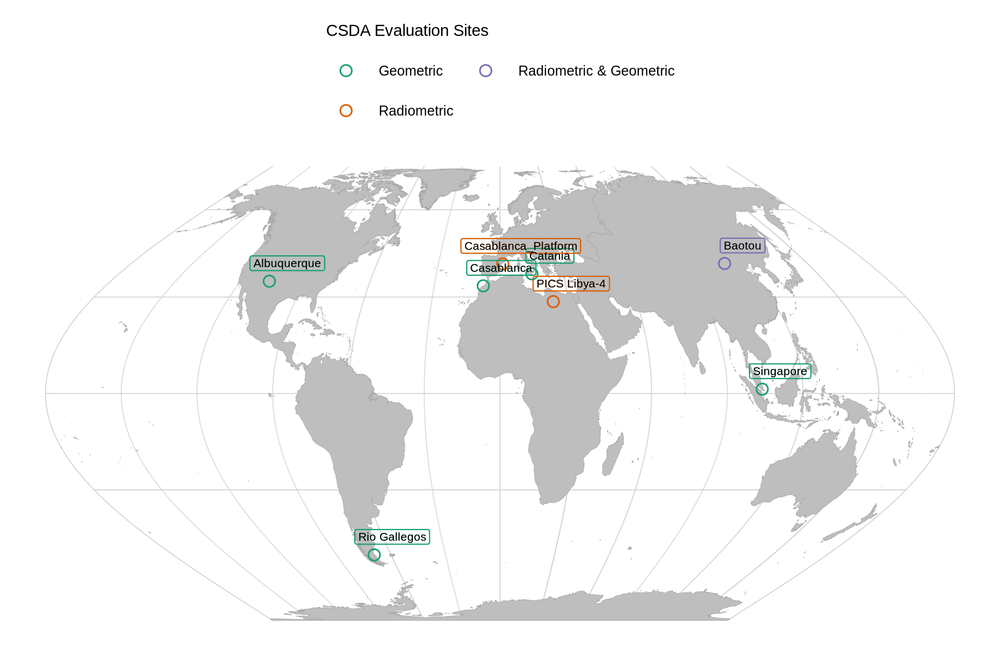

In [24]:


base_map +   # Finally add the site points
  geom_sf(data = sites_proj_subset
          , aes(color=`Evaluation.Category`), size = 2, shape=1) +
  geom_sf_label(data = sites_proj_subset, aes(label = `Site.Name`, color=`Evaluation.Category`), 
               nudge_x = 7e5, nudge_y = 7e5, size = 1.75, show.legend = FALSE) +
  geom_sf_text(data = sites_proj_subset, aes(label = `Site.Name`), 
               nudge_x = 7e5, nudge_y = 7e5, size = 1.75, show.legend = FALSE) +
    scale_color_brewer(palette = 'Dark2', name=paste0('CSDA Evaluation Sites '),
                       guide = guide_legend(
                           ncol=2,
          override.aes = list(
            size = 2,          # Point size
            label = ""         # Remove text from legend
          )
        )
                      ) 